# Example 3: studyforrest #

In [10]:
# for auto-reloading external modules
%load_ext autoreload
%autoreload 2

## `import` libraries ## 

In [11]:
import os

In [12]:
import dyneusr as ds
import kmapper as km
import networkx as nx

In [13]:
import numpy as np
import pandas as pd
import scipy as sp

In [14]:
from sklearn.datasets.base import Bunch
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [15]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
sns.set("paper", "white")
%matplotlib inline

DEBUG:matplotlib.backends:backend module://ipykernel.pylab.backend_inline version unknown


## Load `data` ##

In [16]:
from load_data import load_studyforrest, Bunch

# load data
sessions = load_studyforrest(n_subjects=-1, n_runs=1)
sessions = [_ for _ in sessions if _.name in ['sub14', 'sub18']]
print([_.name for _ in sessions])

INFO:load_data:load_studyforrest(n_subjects=-1, n_runs=1)
INFO:load_data:found 120 data files
INFO:load_data:      15 subjects
INFO:load_data:      8 runs
INFO:load_data:found 1 meta data files
INFO:load_data:found 1 mask data files
INFO:load_data:Loading data...


(3599, 30) (451, 275)


/Users/calebgeniesse/src/miniconda3/lib/python3.6/site-packages/scipy/signal/_arraytools.py:45: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  b = a[a_slice]


(3599, 30) (451, 277)
(3599, 30) (451, 280)
(3599, 30) (451, 279)
(3599, 30) (451, 280)
(3599, 30) (451, 269)
(3599, 30) (451, 279)
(3599, 30) (451, 280)
(3599, 30) (451, 280)
(3599, 30) (451, 279)
(3599, 30) (451, 280)
(3599, 30) (451, 280)
(3599, 30) (451, 280)
(3599, 30) (451, 280)
(3599, 30) (451, 280)
['sub14', 'sub18']


### Visual inspection of data, meta

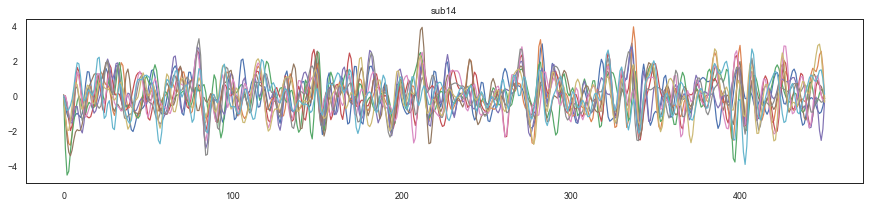

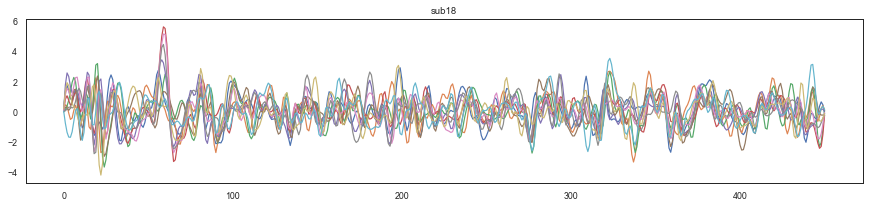

In [17]:
for session in sessions:
    _ = session.data.iloc[:,:10].plot(figsize=(15,3), legend=False, title=session.name)

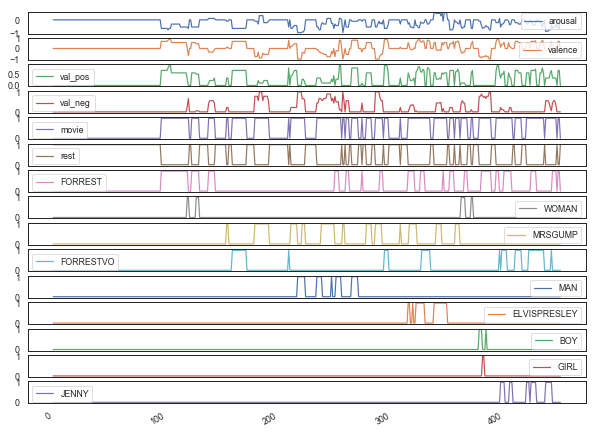

In [18]:
_ = sessions[0].target.plot(figsize=(10,8),  subplots=True)#, legend=False)

In [19]:
# extract subset of meta
y = sessions[0].target.copy()
y_block = y.dot(y.T) 

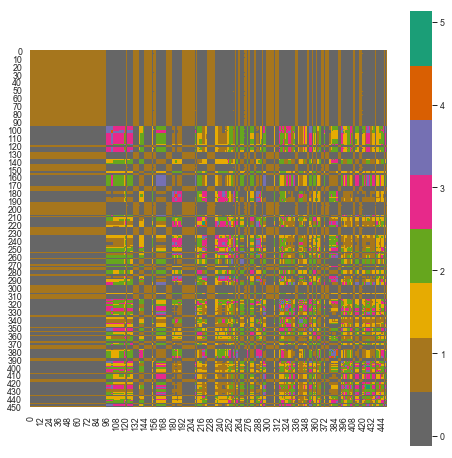

In [20]:
# plot
fig, ax = plt.subplots(1,1,figsize=(8,8))
_ = sns.heatmap(y_block, ax=ax, square=True, cbar=True, cmap='Dark2_r')

DEBUG:matplotlib.font_manager:findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=24.0 to Arial ('/Library/Fonts/Arial.ttf') with score of 0.050000


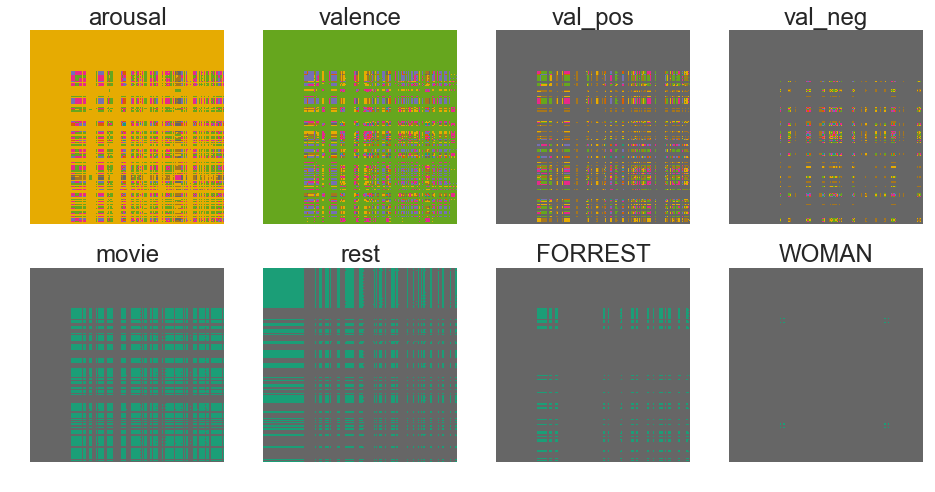

In [21]:
# visualize example of each stim    
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = np.ravel(axes)
for ax, stim in zip(axes, y.columns[:]):
    # get y block for col
    y_ = y.loc[:, [stim]].copy()    
    y_block_ = y_.dot(y_.T) 
    
    # plot 
    sns.heatmap(y_block_, ax=ax, square=True, cbar=False, cmap='Dark2_r')
    ax.set_title(stim, fontsize=24)    
    ax.axis('off')


## Generate $MAPPER$ graph + visualize with `dyneusr` ##

[subject sub14]
X has shape: (451, 278)
y has shape: (451, 15)


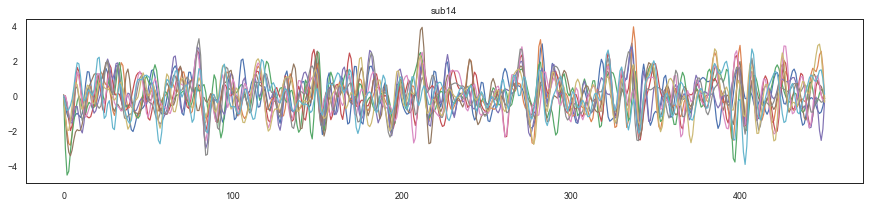


Mapping...

projection = TSNE(angle=0.5, early_exaggeration=12.0, init='pca', learning_rate=200.0,
   method='exact', metric='euclidean', min_grad_norm=1e-07, n_components=2,
   n_iter=1000, n_iter_without_progress=300, perplexity=50,
   random_state=123, verbose=0)

clusterer = DBSCAN(algorithm='auto', eps=14.929231432069882, leaf_size=30,
    metric='minkowski', metric_params=None, min_samples=1, n_jobs=1, p=2)

cover = {'n_cubes': 13, 'perc_overlap': 0.67, 'limits': None}
________________________________________________________________________________
[Memory] Calling dyneusr.mapper.wrappers._map_graph...
_map_graph(lens=array([[0.390688, 0.418749],
       ...,
       [0.387027, 0.413183]], dtype=float32), X=array([[-0.089785, ..., -0.14421 ],
       ...,
       [-0.130526, ..., -0.260791]]), clusterer=DBSCAN(algorithm='auto', eps=14.929231432069882, leaf_size=30,
    metric='minkowski', metric_params=None, min_samples=1, n_jobs=1, p=2), cover=<kmapper.cover.Cover object at 0x11148

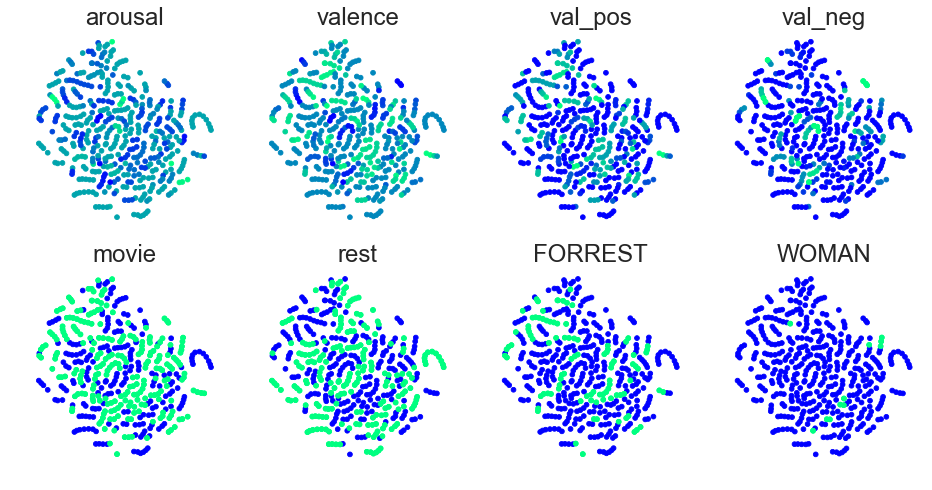

label,group,value,row_count
arousal,0,-85.87,450
valence,1,31.68,450
val_pos,2,97.36,450
val_neg,3,65.69,450
movie,4,239.00,450
rest,5,211.00,450
FORREST,6,96.00,450
WOMAN,7,11.00,450
MRSGUMP,8,66.00,450
FORRESTVO,9,53.00,450



dG.MAP: (451, 238)
Saving TCM for subject... studyforrest_sub14_TCM.npy


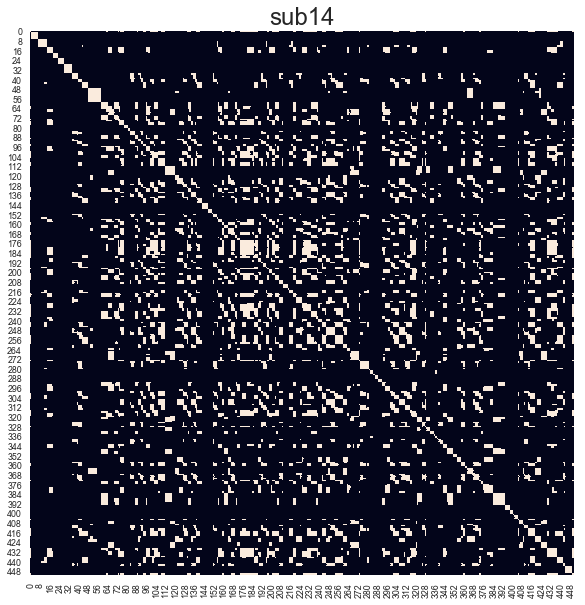

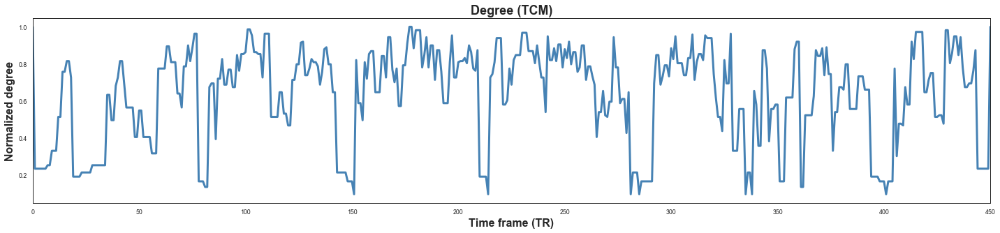

Already serving localhost:8803 
[Force Graph] http://localhost:8803/studyforrest_sub14.html




[subject sub18]
X has shape: (451, 278)
y has shape: (451, 15)


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

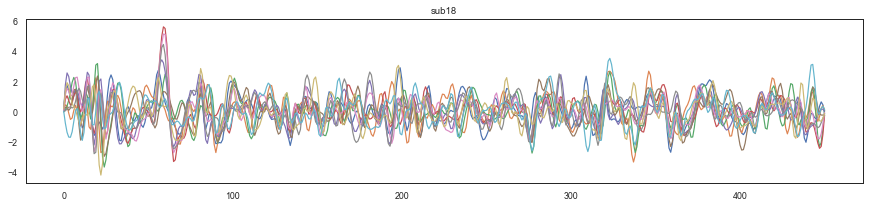


Mapping...

projection = TSNE(angle=0.5, early_exaggeration=12.0, init='pca', learning_rate=200.0,
   method='exact', metric='euclidean', min_grad_norm=1e-07, n_components=2,
   n_iter=1000, n_iter_without_progress=300, perplexity=50,
   random_state=123, verbose=0)

clusterer = DBSCAN(algorithm='auto', eps=14.404043168815672, leaf_size=30,
    metric='minkowski', metric_params=None, min_samples=1, n_jobs=1, p=2)

cover = {'n_cubes': 13, 'perc_overlap': 0.67, 'limits': None}
________________________________________________________________________________
[Memory] Calling dyneusr.mapper.wrappers._map_graph...
_map_graph(lens=array([[0.489224, 0.454455],
       ...,
       [0.49629 , 0.443   ]], dtype=float32), X=array([[ 0.229262, ..., -0.117072],
       ...,
       [-0.178654, ..., -0.154638]]), clusterer=DBSCAN(algorithm='auto', eps=14.404043168815672, leaf_size=30,
    metric='minkowski', metric_params=None, min_samples=1, n_jobs=1, p=2), cover=<kmapper.cover.Cover object at 0x125da

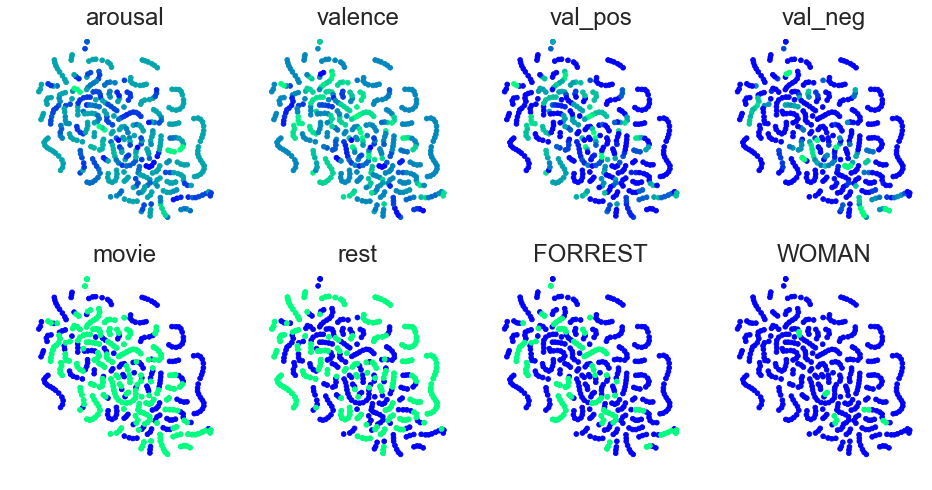

label,group,value,row_count
arousal,0,-85.87,450
valence,1,31.68,450
val_pos,2,97.36,450
val_neg,3,65.69,450
movie,4,239.00,450
rest,5,211.00,450
FORREST,6,96.00,450
WOMAN,7,11.00,450
MRSGUMP,8,66.00,450
FORRESTVO,9,53.00,450



dG.MAP: (451, 274)
Saving TCM for subject... studyforrest_sub18_TCM.npy


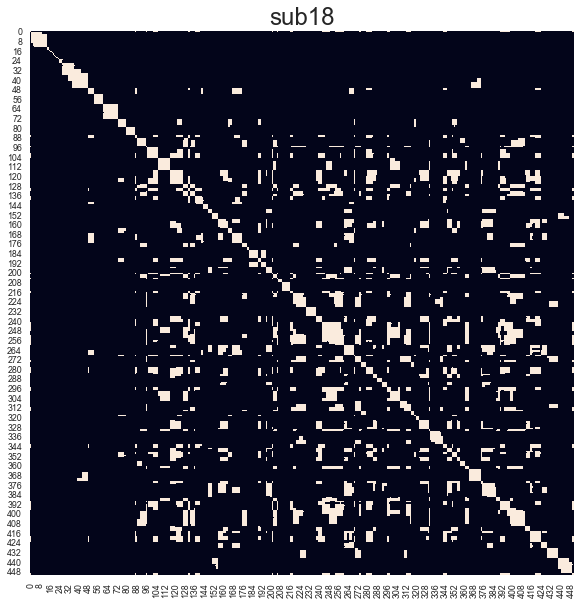

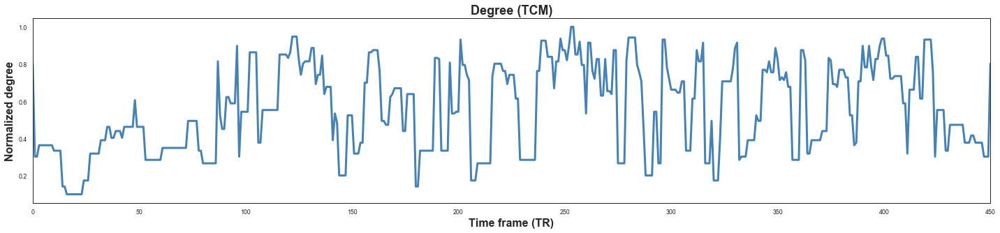

Already serving localhost:8803 
[Force Graph] http://localhost:8803/studyforrest_sub18.html


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [79]:
from dyneusr.mapper.wrappers import KMapperWrapper
from dyneusr.mapper.utils import optimize_cover, optimize_dbscan

# loop over sessions, run for each
for i, session in enumerate(sessions):
    
    ### Setup
    subject = session.name
    X = X_inverse = session.data.values
    y = session.target
    print('[subject {}]'.format(subject))
    print('X has shape: {}'.format(X.shape))
    print('y has shape: {}'.format(y.shape))
    _ = session.data.iloc[:,:10].plot(figsize=(15,3), legend=False, title=session.name)
    plt.show()
    
    
    ### Run MAPPER
    print("\nMapping...")
    projection = TSNE(perplexity=50, random_state=123, init='pca', method='exact')
    clusterer = optimize_dbscan(X)
    cover = optimize_cover(X, r=30, g=0.67, scale_r=True)
    print('\nprojection = {}'.format(projection))
    print('\nclusterer = {}'.format(clusterer))
    print('\ncover = {}'.format(cover.__dict__))
    
    # run kmapper 
    mapper = KMapperWrapper(memory='dyneusr_cache/{}'.format(subject))    
    mapper.fit_lens(data=X, projection=projection)        
    mapper.fit_graph(data=X, clusterer=clusterer, cover=cover)
    
    # extract results
    lens = mapper.lens_.copy()
    graph = dict(mapper.graph_)
    
    
    ### Visualize MAPPER
    print("\nVisualizing...")
    # visualize lens
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    for ax, stim in zip(np.ravel(axes), y.columns):
        y_mask = (y[stim] == 1)
        ax.scatter(*lens.T, c=y[stim], cmap='winter')    
        ax.scatter(*lens[y_mask].T, c=y[y_mask][stim], cmap='winter_r')
        ax.set_title(stim, fontsize=24)    
        ax.axis('off')  
    plt.show()
    
    # fit DyNeuGraph
    dG = ds.DyNeuGraph(G=graph, y=y)
    print('\ndG.MAP:', dG.M.shape)

    # save tcm
    print('Saving TCM for subject...', end=' ')
    tcm_npy = 'studyforrest_{}_TCM.npy'.format(subject)
    np.save(tcm_npy, dG.TCM)
    print(tcm_npy)
    
    # plot matrices
    ax = sns.heatmap(dG.TCM, figure=plt.figure(figsize=(10,10)), square=True, cbar=False)
    ax.set_title(subject, fontsize=24)
    tcm_jpg = 'studyforrest_{}_TCM.jpg'.format(subject)
    plt.savefig(tcm_jpg, dpi=300, transparent=True)
    
    # plot temporal evolution
    ds.visuals.plot_temporal_degree(dG.TCM, window=1, show=True)
    tcm_jpg = 'studyforrest_{}_TCM_degree.jpg'.format(subject)
    plt.savefig(tcm_jpg, dpi=300, transparent=True)

        
    # vis d3-force
    dG.visualize('studyforrest_{}.html'.format(subject), path_assets='results', show=True, port=8803)
    
    
    # store data
    session.mapped = Bunch(
        data=X,
        lens=lens,
        graph=graph,
        dG=dG, X=X, y=y
        )
    sessions[i] = session
    
    # finish 
    print()
    print()
    
    
    

### Average over TCMs ###

In [23]:
# TCMS
TCMs = np.array([_.mapped.dG.TCM.copy() for _ in sessions])
print("TCMs has shape:", TCMs.shape)

# save
print('Saving TCMs...', end=' ')
tcm_npy = 'studyforrest_TCMs.npy'
np.save(tcm_npy, TCMs)
print(tcm_npy)


TCMs has shape: (2, 451, 451)
Saving TCMs... studyforrest_TCMs.npy


In [24]:
# average over all
mean_TCM = TCMs.mean(axis=0)


# save tcm
print('Saving mean_TCM...', end=' ')
tcm_npy = 'studyforrest_mean_TCM.npy'
np.save(tcm_npy, mean_TCM)
print(tcm_npy)

Saving mean_TCM... studyforrest_mean_TCM.npy


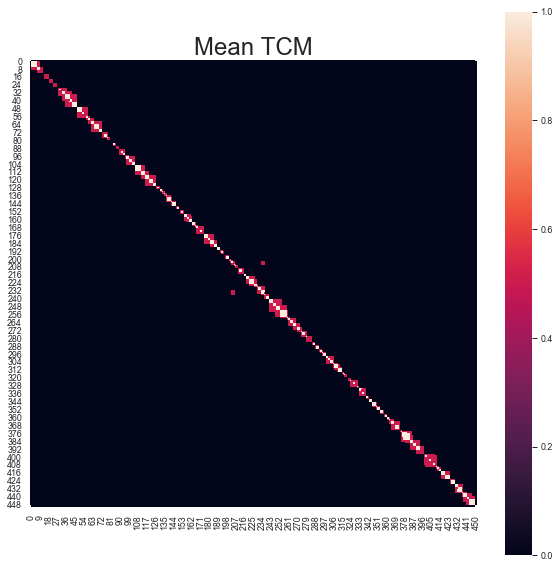

In [25]:
mean_TCM = np.load( 'studyforrest_mean_TCM.npy')
ax = sns.heatmap(mean_TCM, figure=plt.figure(figsize=(10,10)), square=True, cbar=True)
ax.set_title('Mean TCM', fontsize=24)
tcm_jpg = 'studyforrest_mean_TCM.jpg'
plt.savefig(tcm_jpg, dpi=300, transparent=True)


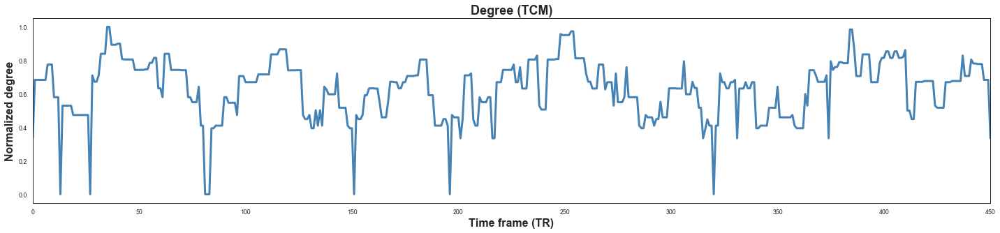

In [26]:
# plot temporal evolution
ds.visuals.plot_temporal_degree(mean_TCM, window=1, show=False)
tcm_jpg = 'studyforrest_mean_TCM_degree.jpg'.format(subject)
plt.savefig(tcm_jpg, dpi=300, transparent=True)

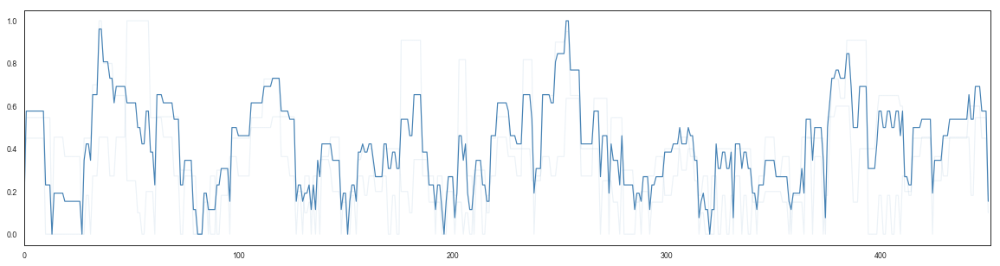

In [27]:
TCMs = np.load('studyforrest_TCMs.npy')

mean_deg = TCMs.sum(axis=2).mean(axis=0)
mean_deg /= mean_deg.max()
plt.figure(figsize=(20,5))
for TCM in TCMs:
    deg = TCM.sum(axis=1) 
    deg /= deg.max()
    sns.lineplot(np.arange(len(deg)), deg, marker='x', linestyle=':', alpha=0.1, color='steelblue')
    
#plt.plot(mean_deg)
sns.lineplot(np.arange(len(deg)), mean_deg, alpha=1.0, color='steelblue')
plt.xlim(0, len(mean_deg))
plt.show()


/Users/calebgeniesse/src/miniconda3/lib/python3.6/site-packages/seaborn/timeseries.py:183: UserWarning: The `tsplot` function is deprecated and will be removed in a future release. Please update your code to use the new `lineplot` function.
  warnings.warn(msg, UserWarning)
/Users/calebgeniesse/src/miniconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


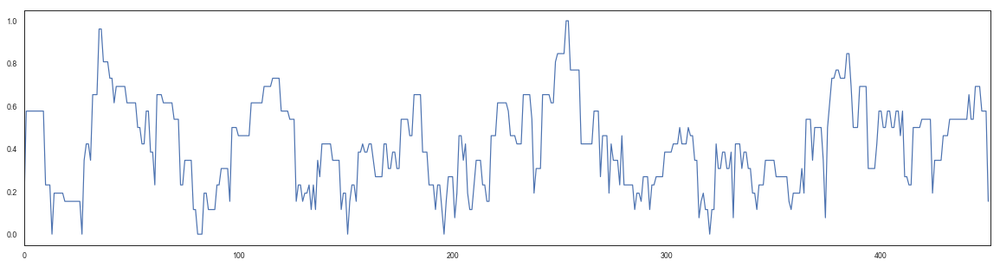

In [28]:

mean_deg = TCMs.sum(axis=1).mean(axis=0)
mean_deg /= mean_deg.max()
plt.figure(figsize=(20,5))
#plt.plot(mean_deg)
sns.tsplot(mean_deg)
plt.xlim(0, len(mean_deg))
plt.show()

### Anchor to anatomy ###

Subject: sub14


/Users/calebgeniesse/src/miniconda3/lib/python3.6/site-packages/numpy/ma/core.py:3169: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  dout = self.data[indx]
/Users/calebgeniesse/src/miniconda3/lib/python3.6/site-packages/numpy/ma/core.py:3201: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  mout = _mask[indx]


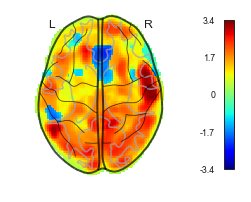

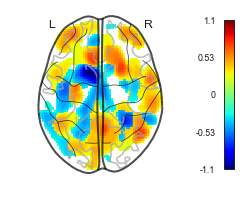

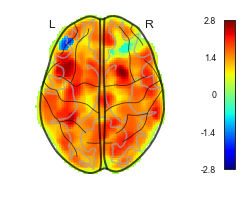

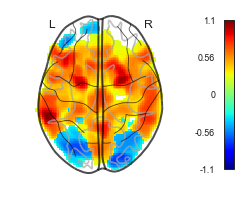

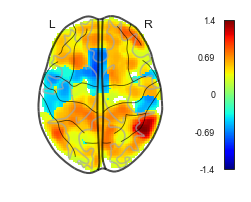

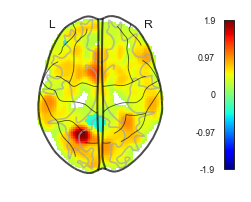

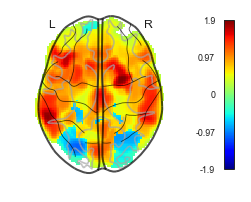

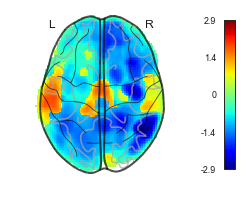

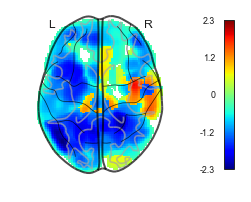

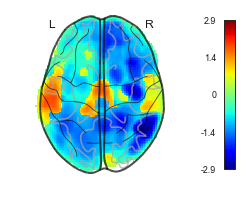

[19 of 238] Saved: results/tooltips/simple_MM_node_cube16_cluster1.png


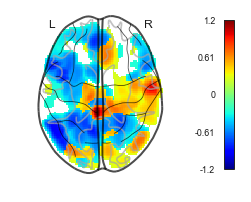

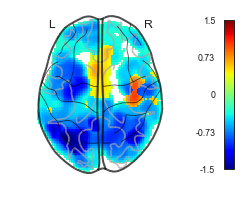

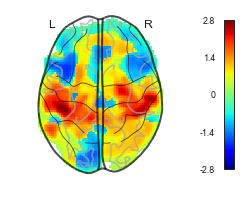

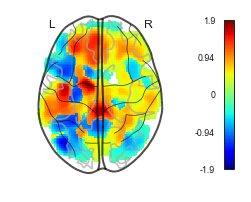

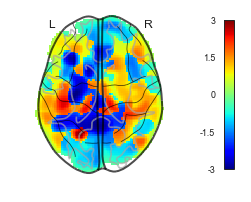

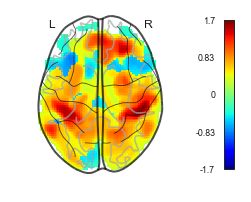

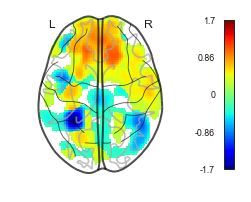

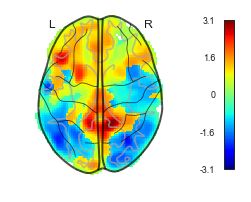

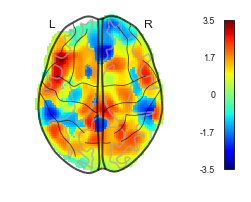

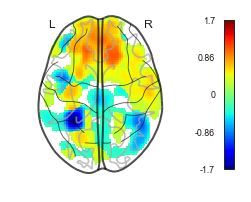

[29 of 238] Saved: results/tooltips/simple_MM_node_cube19_cluster2.png


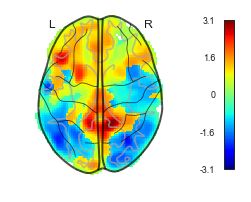

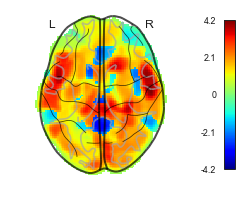

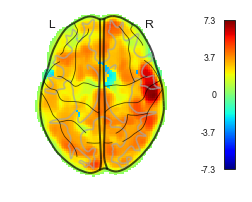

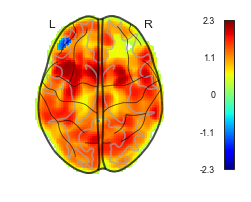

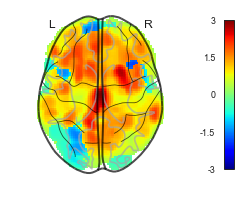

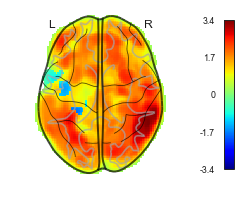

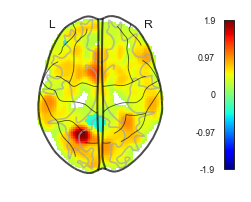

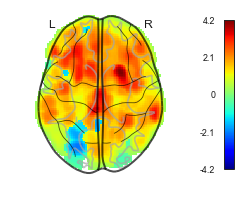

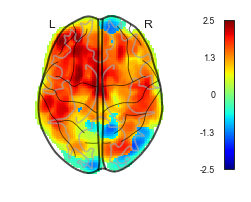

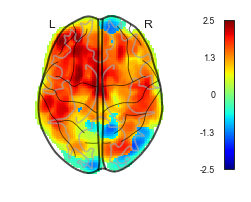

[39 of 238] Saved: results/tooltips/simple_MM_node_cube24_cluster0.png


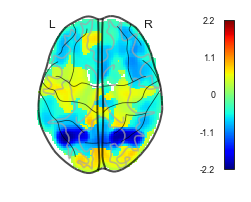

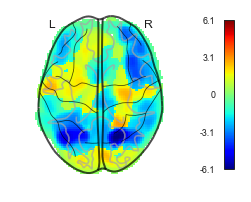

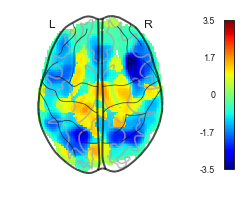

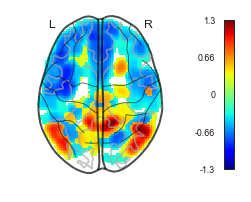

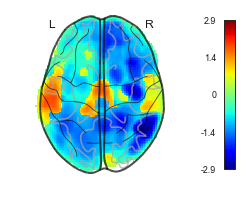

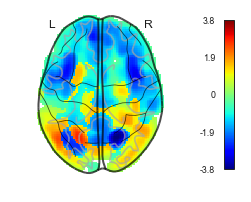

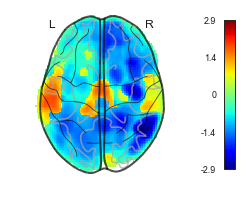

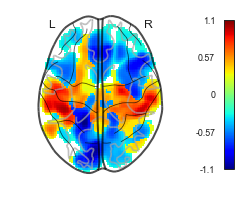

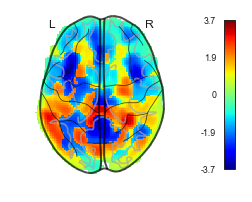

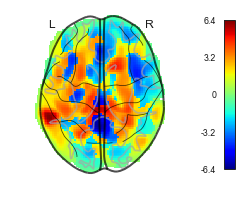

[49 of 238] Saved: results/tooltips/simple_MM_node_cube31_cluster0.png


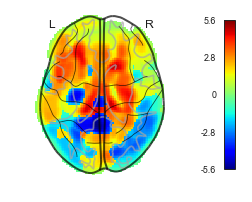

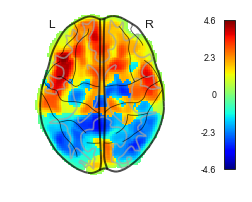

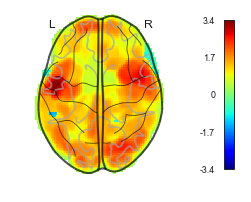

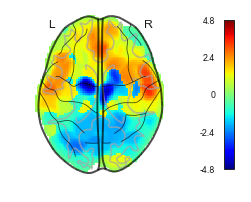

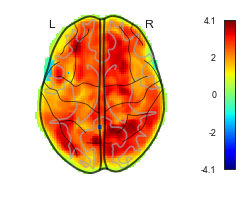

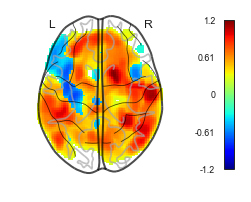

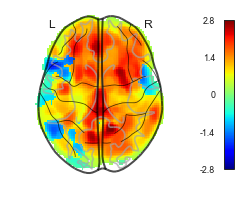

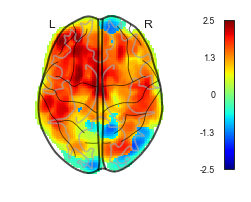

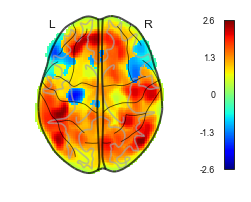

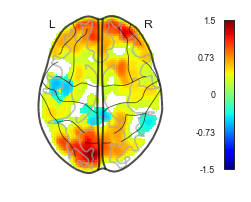

[59 of 238] Saved: results/tooltips/simple_MM_node_cube37_cluster0.png


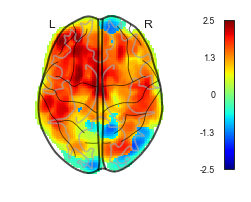

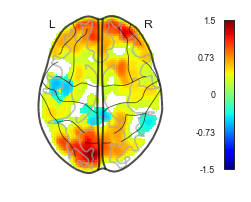

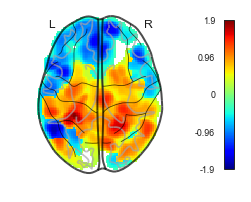

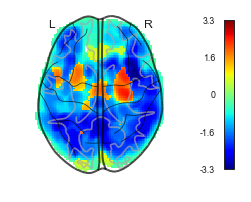

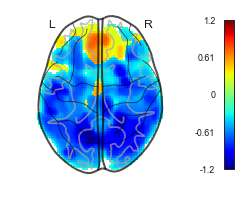

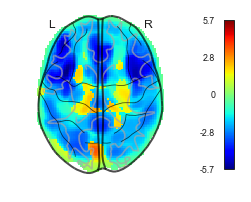

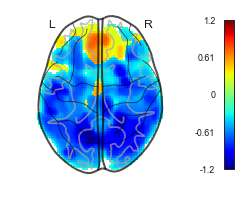

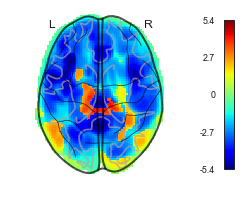

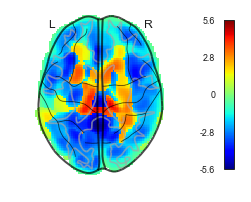

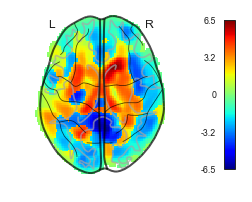

[69 of 238] Saved: results/tooltips/simple_MM_node_cube44_cluster0.png


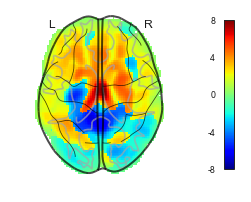

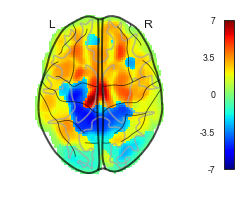

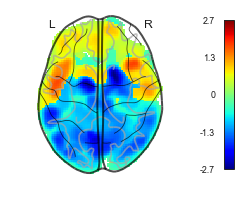

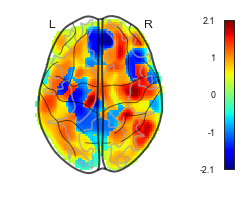

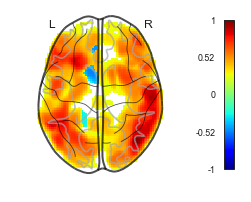

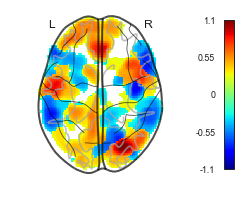

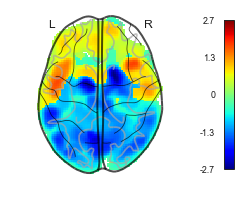

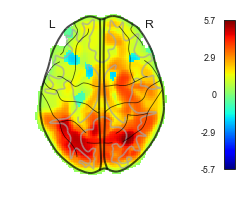

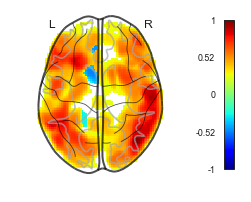

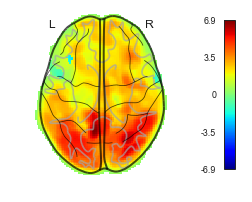

[79 of 238] Saved: results/tooltips/simple_MM_node_cube49_cluster0.png


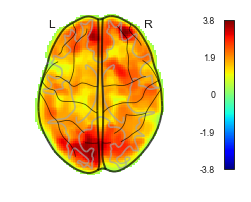

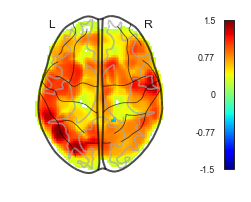

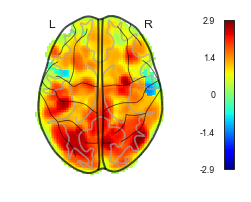

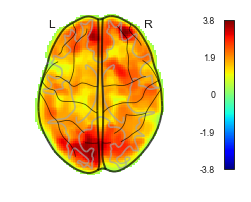

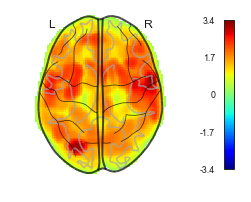

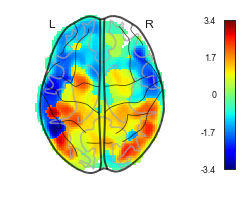

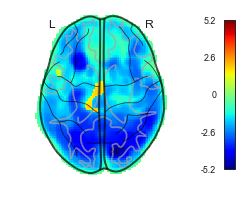

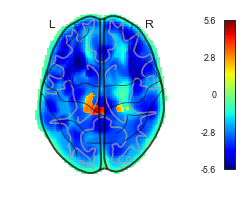

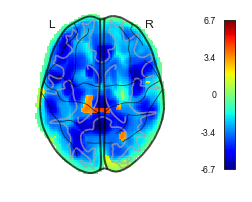

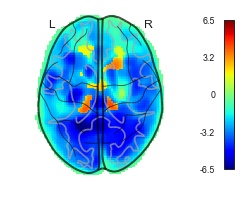

[89 of 238] Saved: results/tooltips/simple_MM_node_cube56_cluster0.png


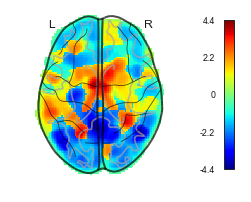

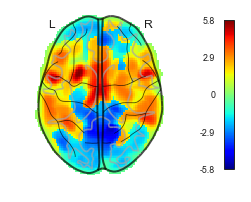

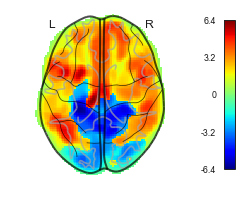

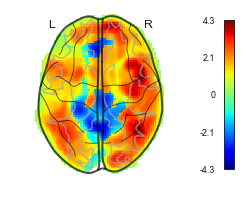

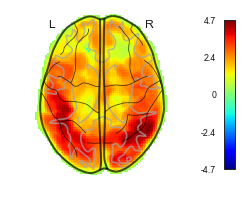

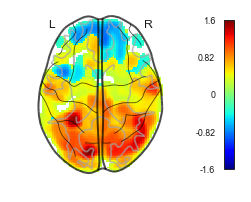

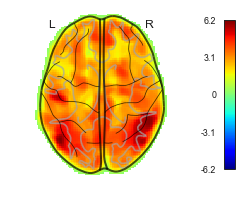

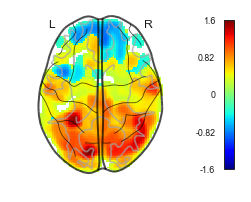

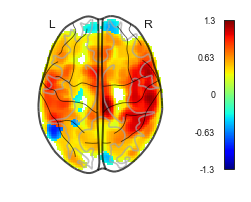

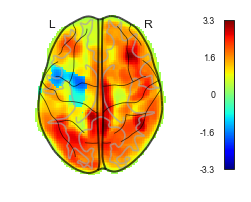

[99 of 238] Saved: results/tooltips/simple_MM_node_cube63_cluster0.png


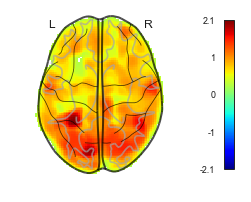

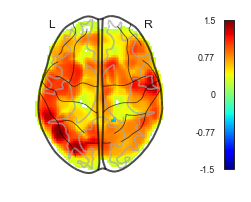

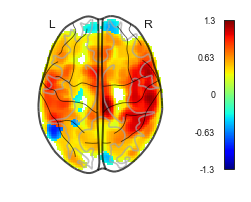

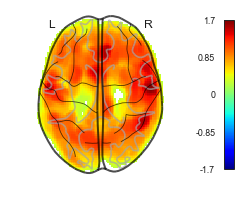

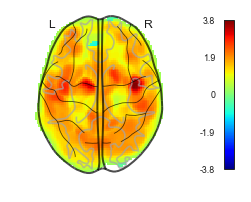

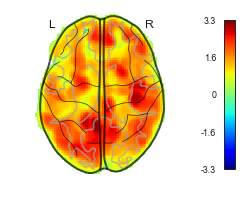

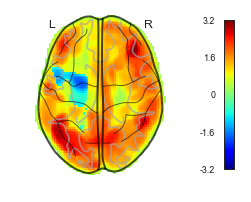

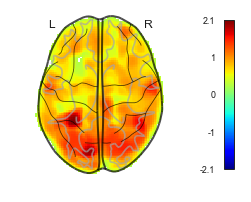

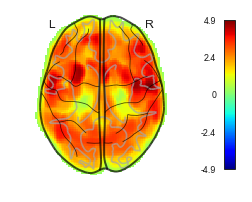

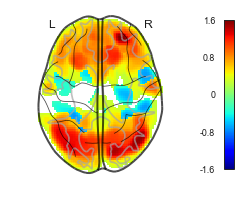

[109 of 238] Saved: results/tooltips/simple_MM_node_cube64_cluster3.png


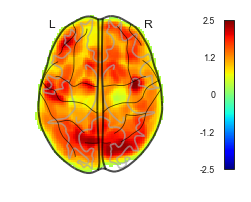

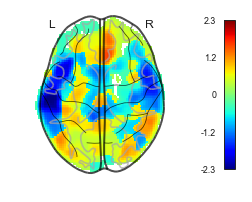

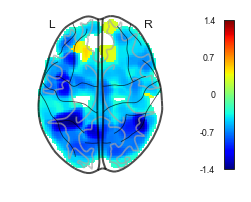

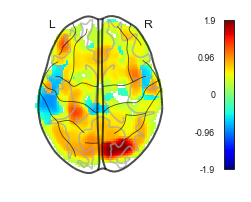

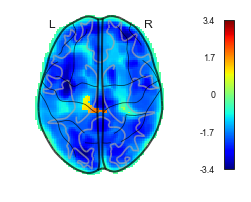

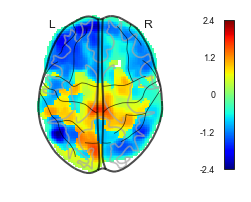

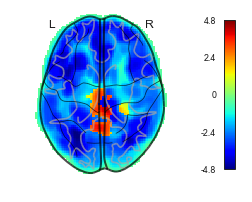

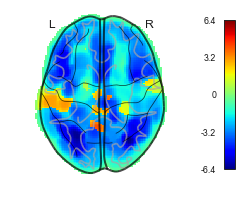

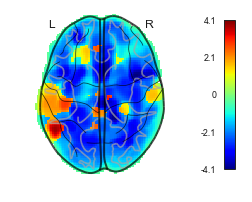

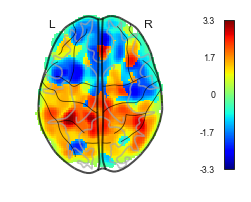

[119 of 238] Saved: results/tooltips/simple_MM_node_cube70_cluster0.png


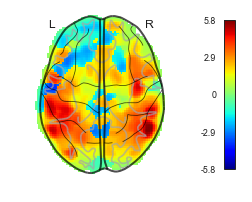

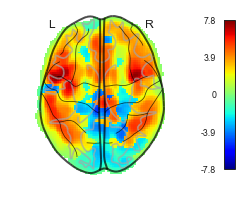

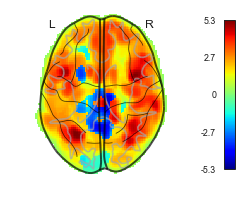

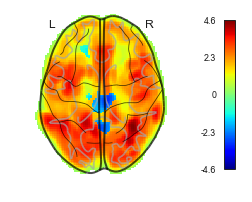

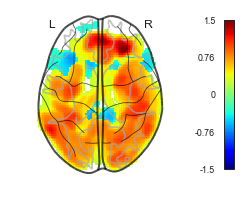

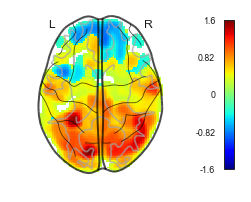

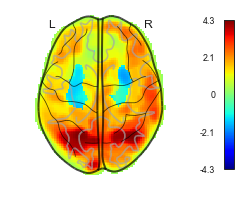

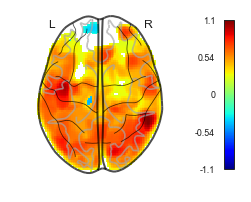

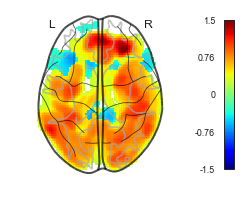

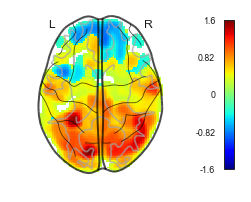

[129 of 238] Saved: results/tooltips/simple_MM_node_cube75_cluster3.png


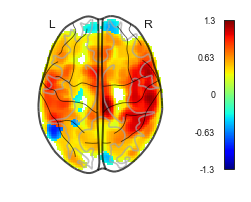

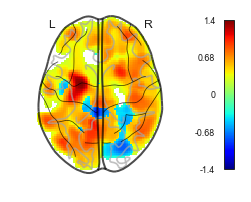

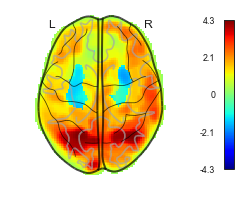

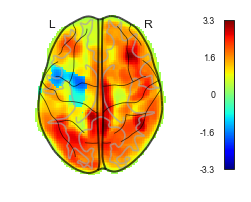

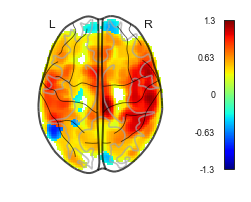

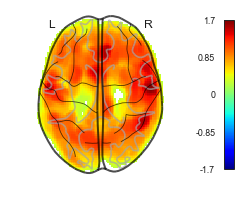

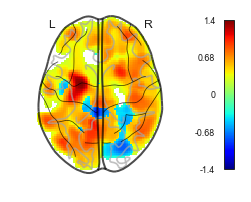

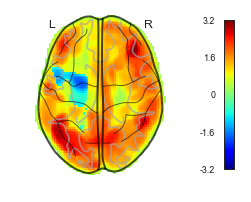

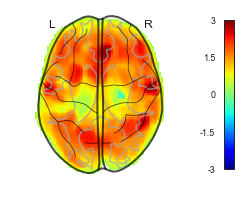

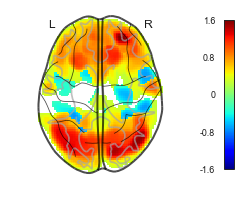

[139 of 238] Saved: results/tooltips/simple_MM_node_cube77_cluster2.png


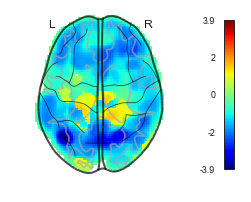

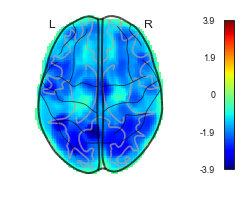

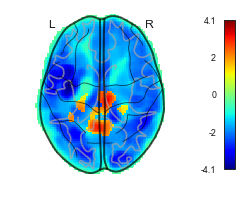

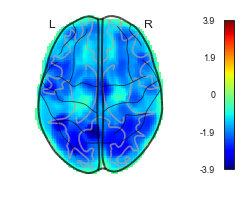

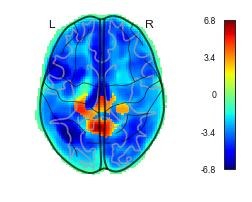

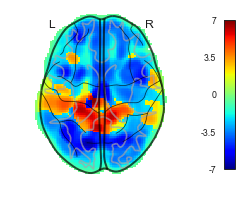

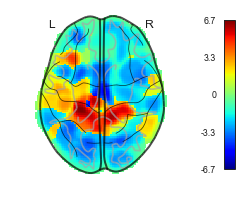

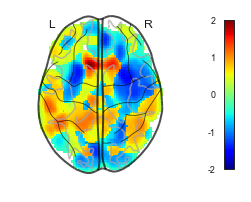

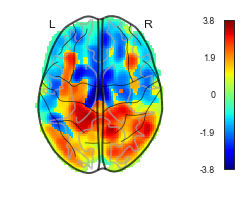

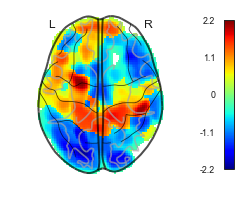

[149 of 238] Saved: results/tooltips/simple_MM_node_cube83_cluster2.png


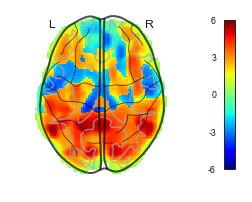

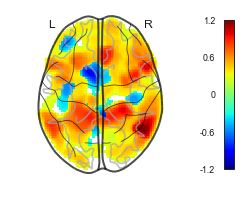

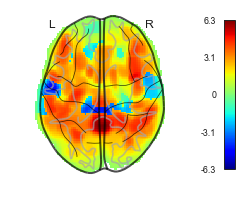

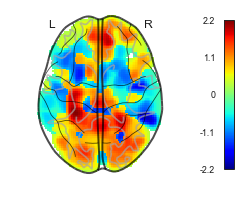

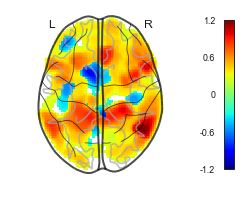

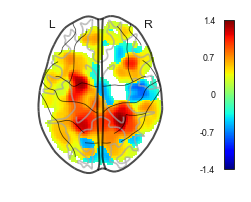

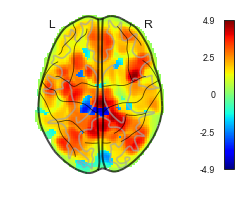

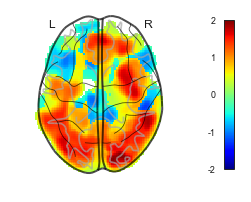

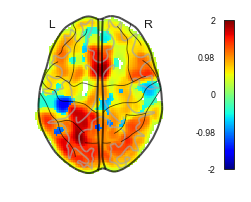

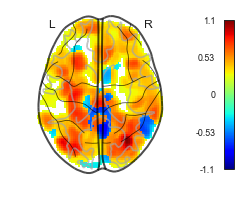

[159 of 238] Saved: results/tooltips/simple_MM_node_cube87_cluster2.png


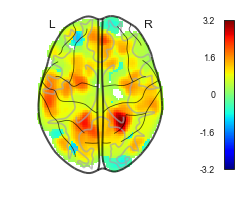

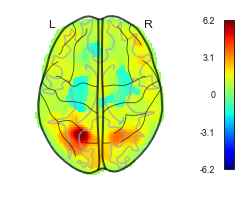

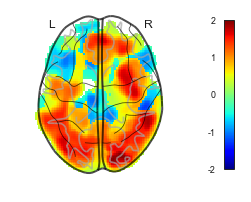

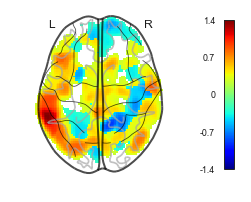

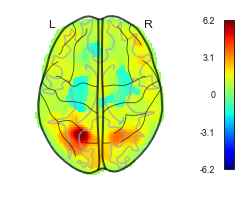

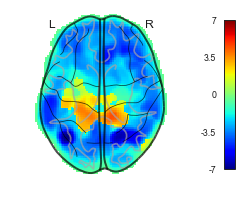

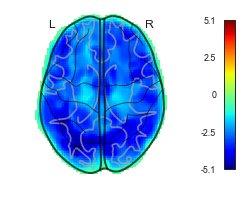

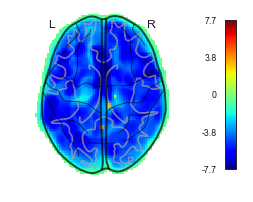

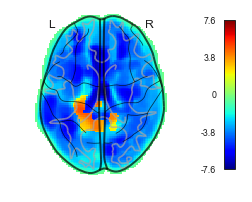

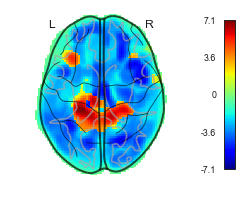

[169 of 238] Saved: results/tooltips/simple_MM_node_cube94_cluster0.png


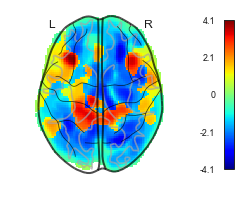

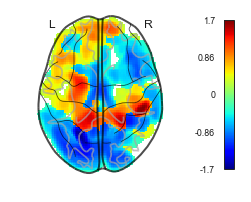

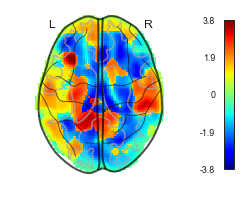

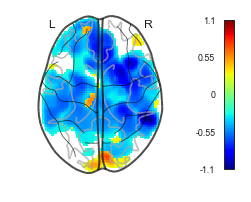

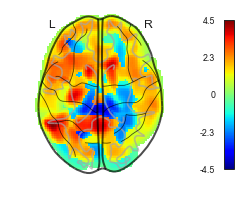

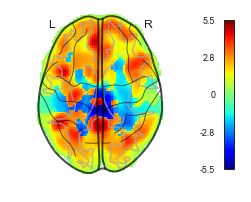

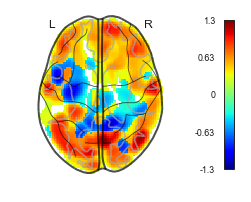

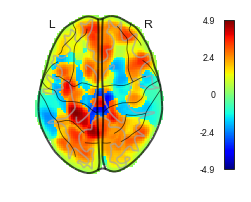

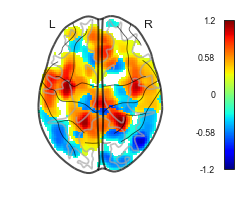

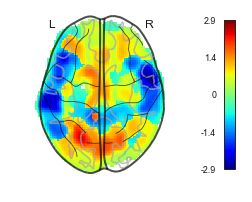

[179 of 238] Saved: results/tooltips/simple_MM_node_cube100_cluster1.png


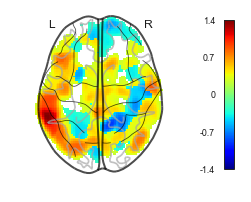

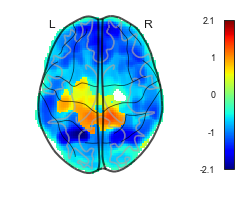

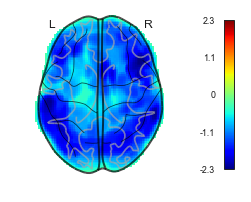

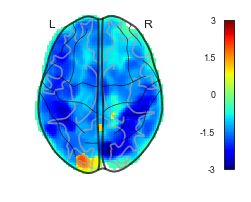

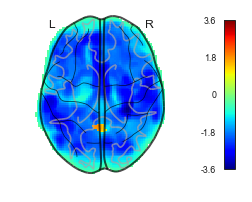

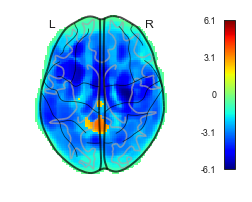

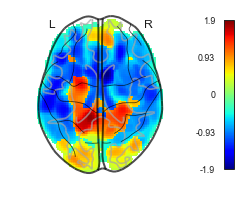

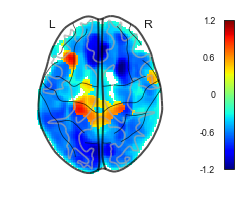

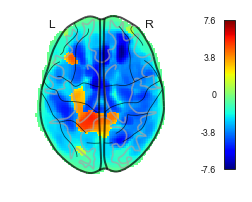

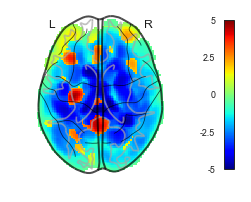

[189 of 238] Saved: results/tooltips/simple_MM_node_cube108_cluster0.png


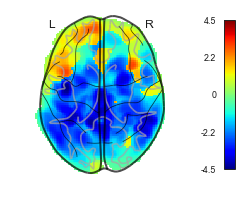

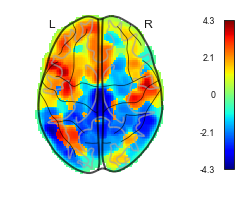

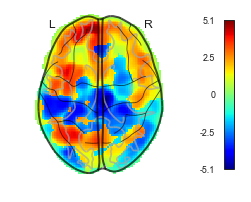

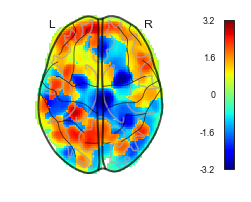

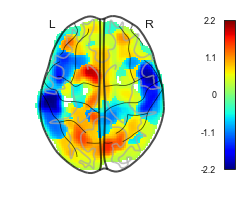

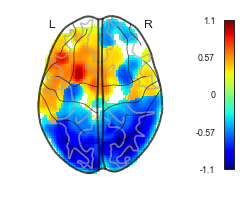

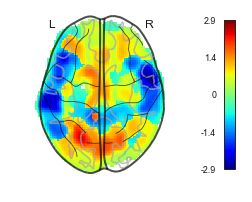

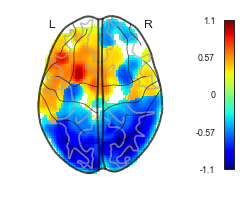

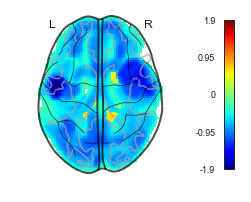

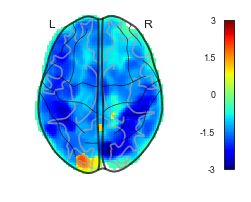

[199 of 238] Saved: results/tooltips/simple_MM_node_cube118_cluster0.png


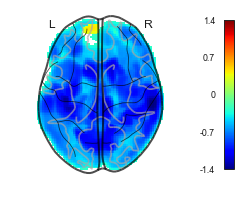

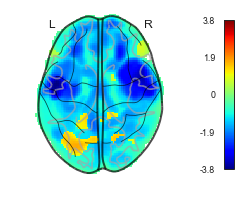

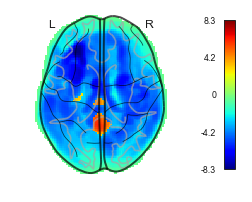

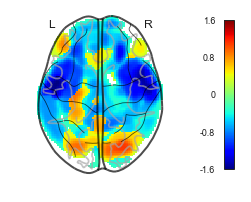

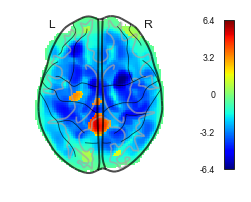

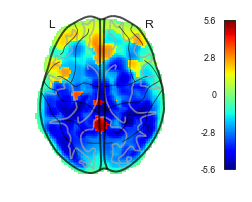

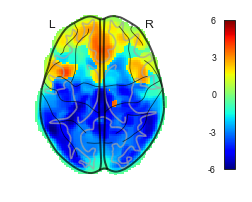

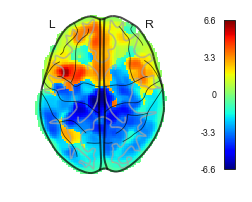

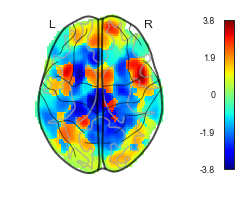

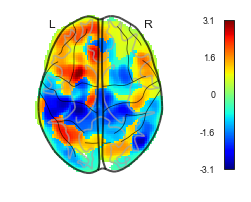

[209 of 238] Saved: results/tooltips/simple_MM_node_cube124_cluster1.png


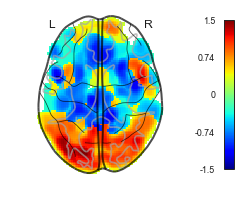

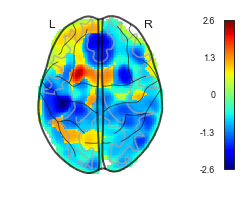

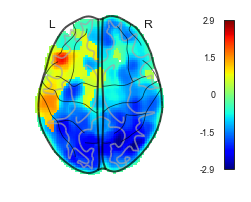

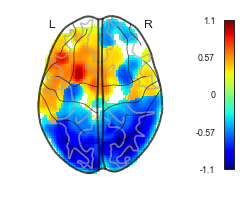

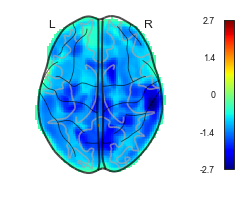

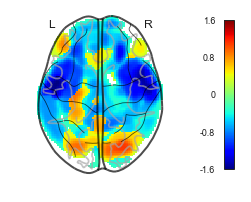

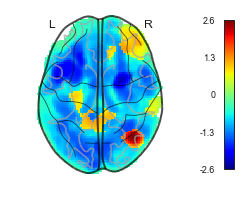

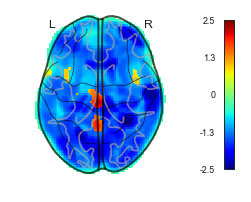

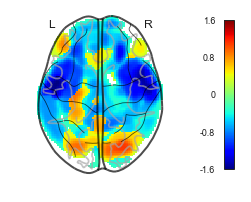

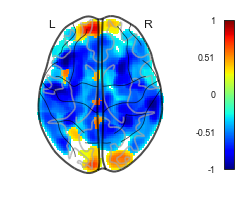

[219 of 238] Saved: results/tooltips/simple_MM_node_cube132_cluster3.png


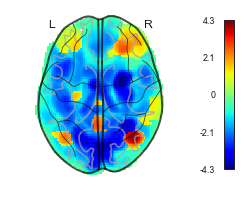

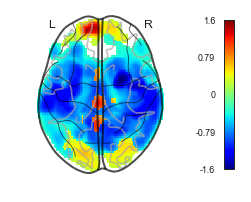

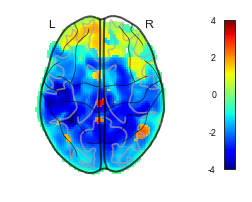

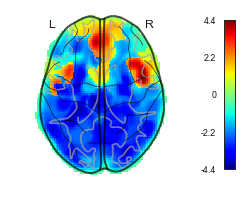

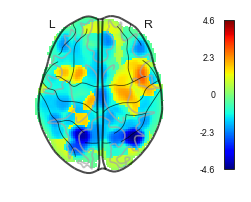

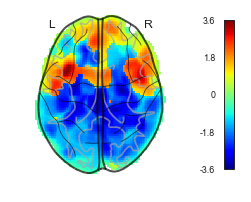

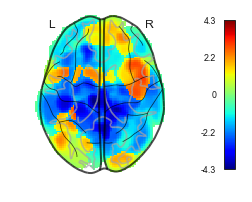

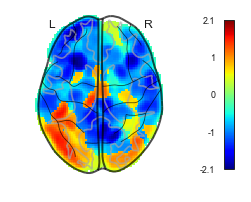

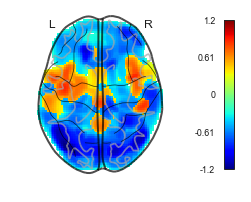

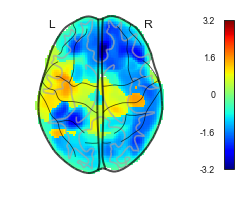

[229 of 238] Saved: results/tooltips/simple_MM_node_cube146_cluster0.png


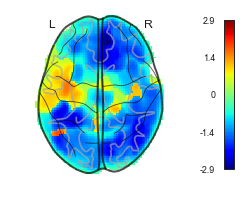

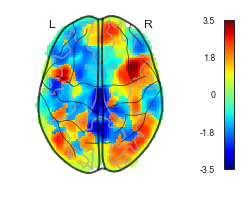

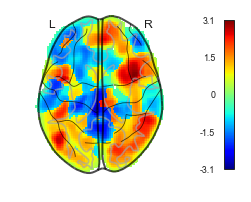

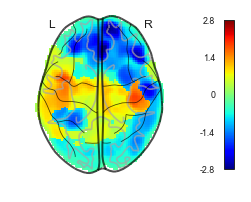

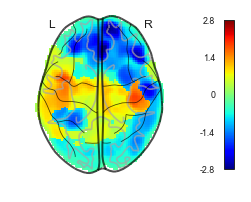

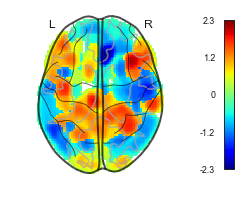

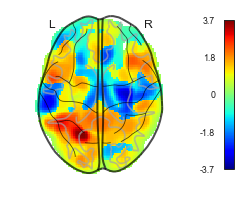

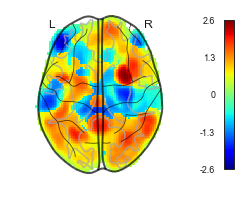

[done]
Already serving localhost:8803 
[Force Graph] http://localhost:8803/studyforrest_anat_sub14.html




Subject: sub18


<Figure size 432x288 with 0 Axes>

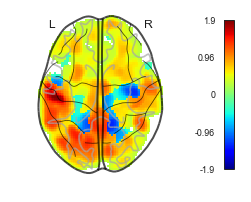

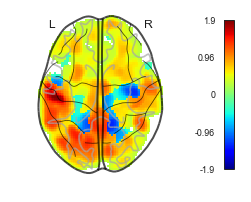

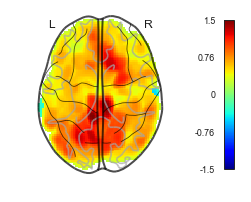

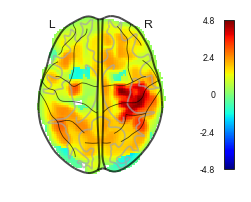

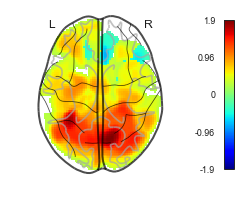

...

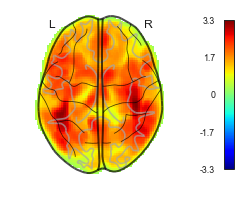

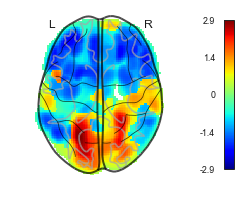

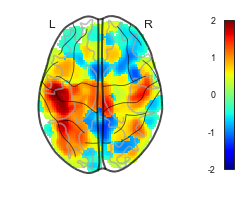

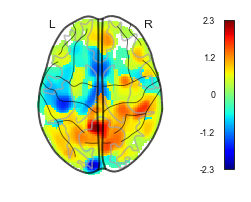

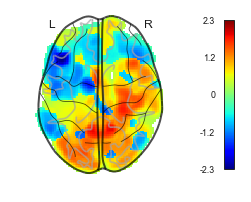

[69 of 274] Saved: results/tooltips/simple_MM_node_cube43_cluster3.png


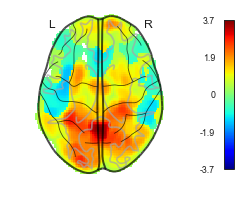

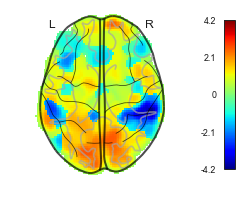

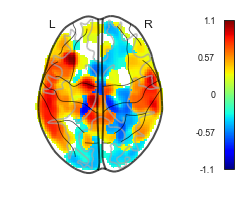

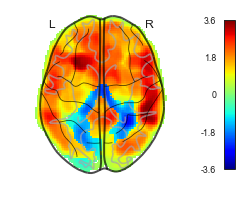

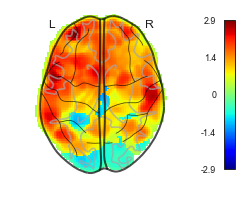

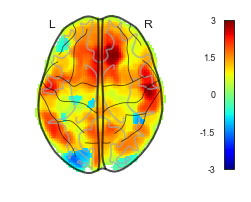

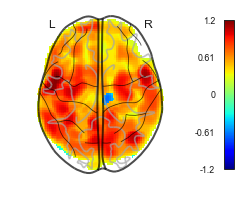

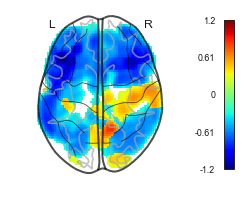

[89 of 274] Saved: results/tooltips/simple_MM_node_cube53_cluster1.png


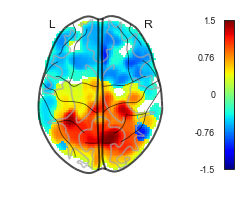

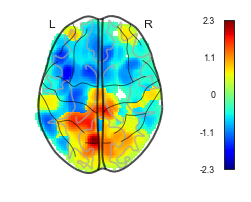

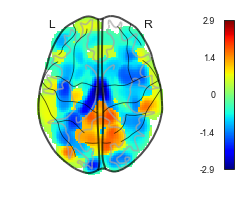

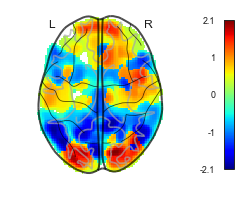

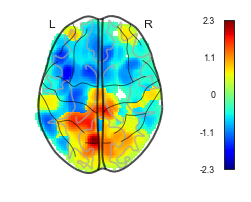

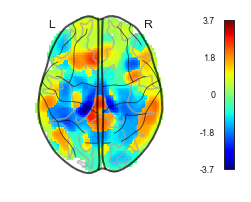

[99 of 274] Saved: results/tooltips/simple_MM_node_cube57_cluster1.png


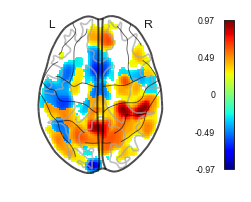

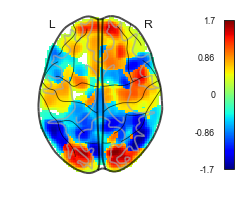

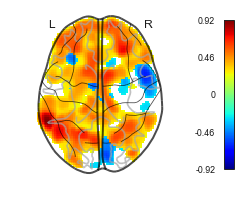

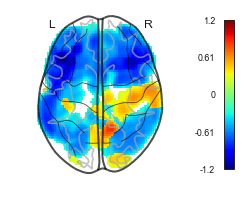

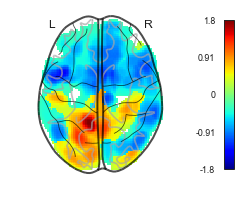

[119 of 274] Saved: results/tooltips/simple_MM_node_cube69_cluster1.png


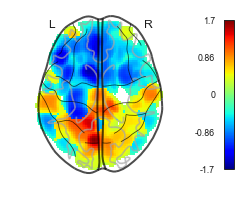

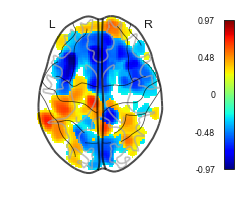

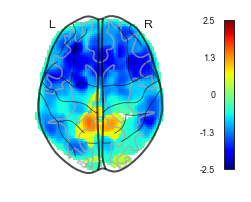

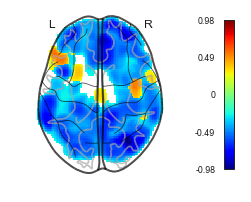

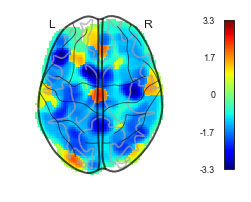

...

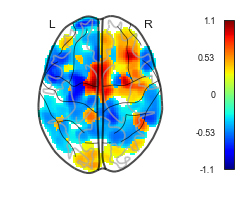

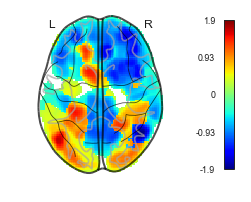

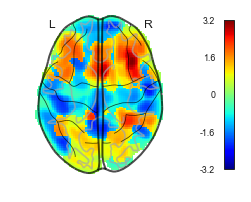

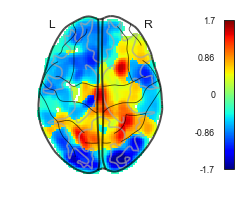

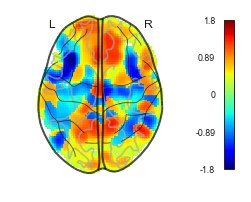

[169 of 274] Saved: results/tooltips/simple_MM_node_cube98_cluster1.png


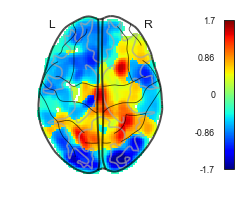

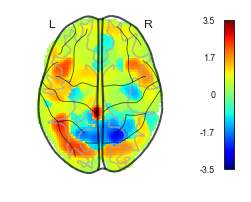

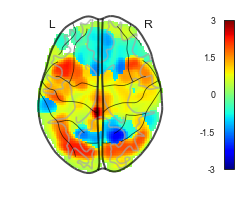

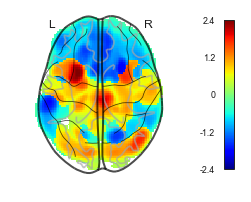

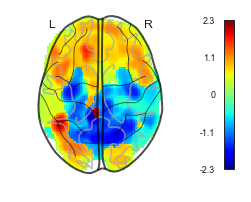

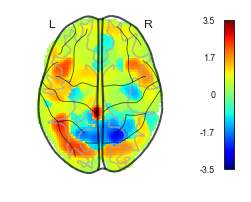

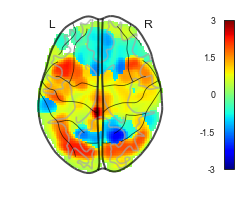

[179 of 274] Saved: results/tooltips/simple_MM_node_cube102_cluster2.png


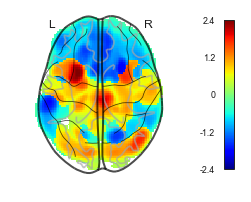

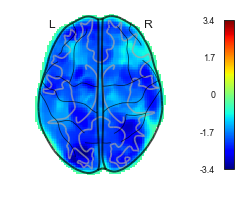

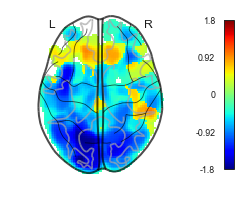

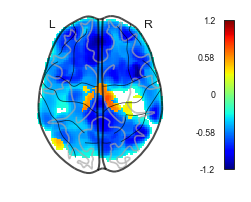

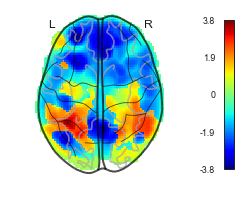

...

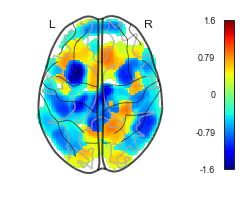

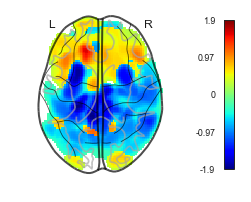

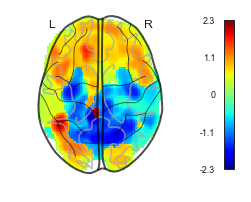

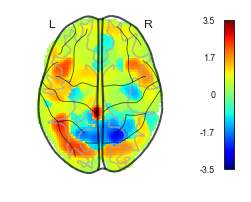

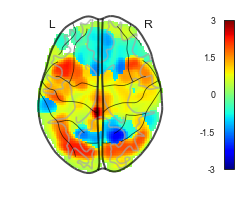

[209 of 274] Saved: results/tooltips/simple_MM_node_cube115_cluster4.png


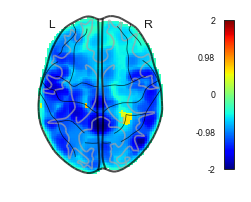

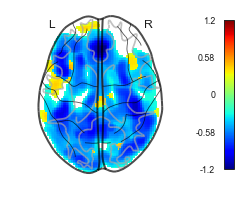

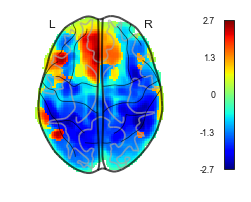

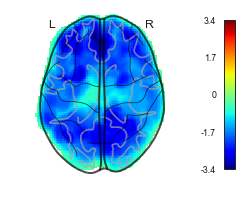

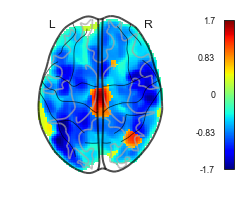

...

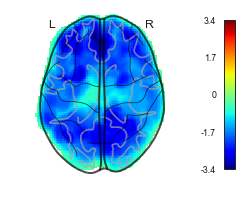

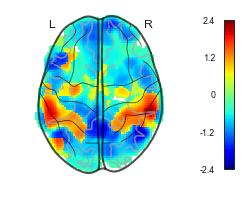

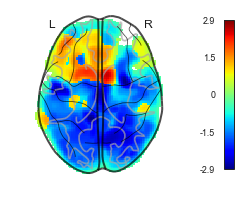

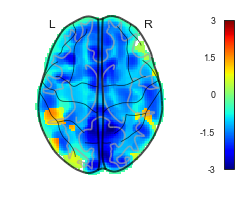

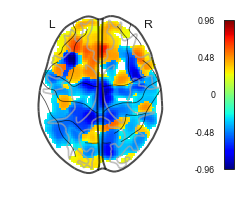

[229 of 274] Saved: results/tooltips/simple_MM_node_cube123_cluster1.png


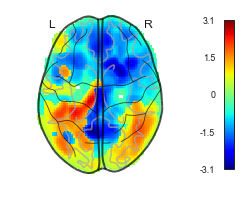

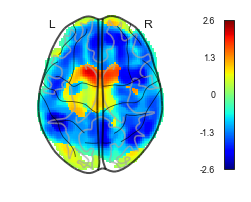

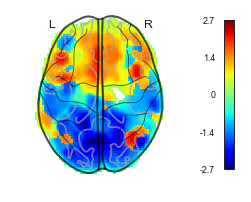

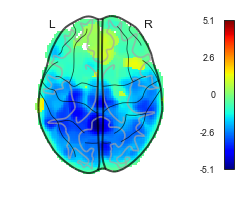

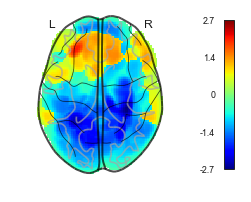

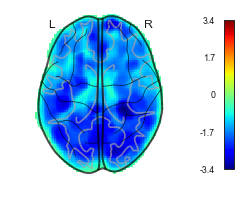

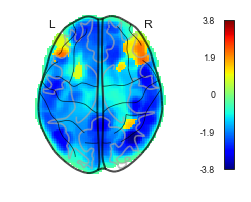

[249 of 274] Saved: results/tooltips/simple_MM_node_cube134_cluster1.png


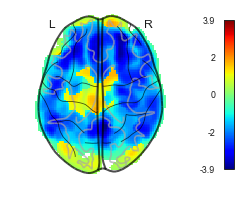

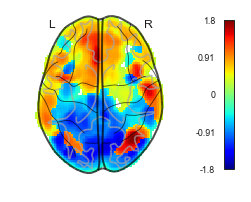

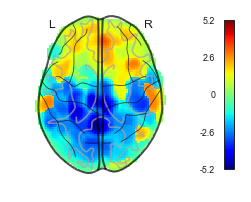

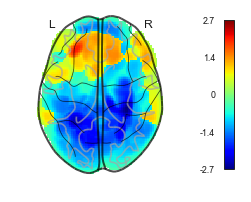

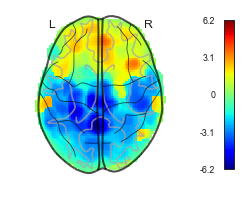

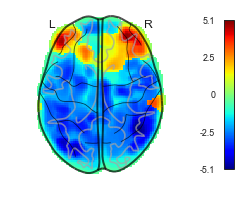

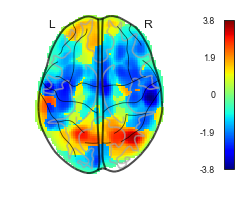

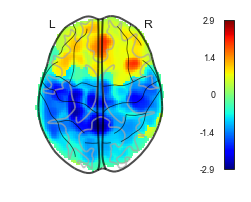

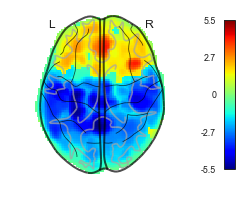

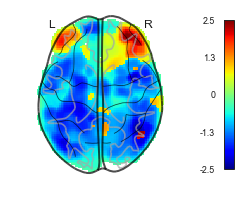

[done]
Already serving localhost:8803 
[Force Graph] http://localhost:8803/studyforrest_anat_sub18.html


<Figure size 432x288 with 0 Axes>

In [85]:
# loop over sessions, run for each
for i,session in enumerate(sessions):
    
    # extract some variables
    subject = session.name
    try:    
        data = session.data
        lens = session.mapped.lens
        dG = session.mapped.dG
        y = session.mapped.y
    except:
        continue
    
    # print some info
    print('Subject: {}'.format(subject)) 
    
    # anchor to anat
    node_images = ds.tools.mixture.simple_mixtures(
        session, mixtures=dict(dG.G_.nodes("members")),
        save_dir='results/tooltips', prefix='node_',
        show_every_n=1, print_every_n=10,
        threshold=0.25, fwhm=8,
        plot_kws=dict(display_mode='z', threshold=0.0, colorbar=not False)
        )
    dG.annotate(image=node_images)
    
    # vis d3-force
    dG.visualize('studyforrest_anat_{}.html'.format(subject), path_assets='results', show=True, port=8803)
    
    
    # store data
    session.mapped.dG = dG
    session.mapped.node_images = node_images 
    sessions[i] = session
    
    # finish 
    print()
    print()
    
    
    

### Visual inspection of nx.Graph object

In [83]:
!rm -r results/tooltips

In [ ]:
from collections import Counter

# loop over sessions, run for each
for i,session in enumerate(sessions):
    
    # extract some variables
    subject = session.name
    try:    
        lens = session.mapped.lens
        dG = session.mapped.dG
        y = session.mapped.y
    except:
        continue
    
    # print some info
    print('Subject: {}'.format(subject)) 
    
    
    # visualize lens
    fig, axes = plt.subplots(2, 4, figsize=(24, 12))
    for ax, y_col in zip(np.ravel(axes), y.columns):        
        # color
        c = y[y_col].values
        cmap = plt.get_cmap('Dark2_r')
        norm = mpl.colors.Normalize(c.min(), c.max())
        c = cmap(norm(c))

        # define column to color by
        c = np.array([mpl.colors.to_hex(_) for _ in c])

        # Color by max
        node_color = [Counter(c[dG.G_.nodes[n]['members']]).most_common()[0][0] for n in dG.G_]
        node_size = [50+len(c[dG.G_.nodes[n]['members']])**1.2 for n in dG.G_]

        # draw 
        ds.tools.networkx_utils.draw_nx(
            dG.G_, lens=lens, pos="inverse", layout=None,
            node_size=node_size, node_color=node_color, 
            ax=ax, 
            )
        ax.set_title(y_col, fontsize=24)            
        ax.axis('off')  

    # finish
    plt.show()
    print()